In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
#reading data from csv
df=pd.read_csv("data.csv",encoding="latin-1")
#df

In [2]:
#structured data in tabular form
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [3]:
print(df.shape)
df.describe()

(541909, 8)


,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [4]:
#Handling missing values
df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [5]:
#dropping null values since description and customerID cannot be imputed with mode, median, mean
df.dropna(subset=["Description","CustomerID"],inplace=True)

In [6]:
#checking the removal of nan
print(df.shape)
df.isnull().sum()

(406829, 8)


InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [7]:
#data format check all are in correct format
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    406829 non-null  object 
 1   StockCode    406829 non-null  object 
 2   Description  406829 non-null  object 
 3   Quantity     406829 non-null  int64  
 4   InvoiceDate  406829 non-null  object 
 5   UnitPrice    406829 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      406829 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 27.9+ MB


In [8]:
#Correcting datatype customer ID ->integer and InvoiceDate ->datetime

df["CustomerID"]=df["CustomerID"].astype("int64")
df["InvoiceDate"]=pd.to_datetime(df["InvoiceDate"])

In [9]:
import re
df["InvoiceNo"].apply(lambda x:"".join(re.findall(r'[^0-9]',x))).value_counts()
#additionally C and space is there so not changing the datatype 

     397924
C      8905
Name: InvoiceNo, dtype: int64

In [10]:
#checking the datatype 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    406829 non-null  object        
 1   StockCode    406829 non-null  object        
 2   Description  406829 non-null  object        
 3   Quantity     406829 non-null  int64         
 4   InvoiceDate  406829 non-null  datetime64[ns]
 5   UnitPrice    406829 non-null  float64       
 6   CustomerID   406829 non-null  int64         
 7   Country      406829 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 27.9+ MB


In [11]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom


In [12]:
#checking the categorical features column by column  if missing value filled other than np.nan like unknown
print(df["StockCode"].value_counts())

85123A    2077
22423     1905
85099B    1662
84879     1418
47566     1416
          ... 
84620        1
90038B       1
84551        1
84614A       1
20957        1
Name: StockCode, Length: 3684, dtype: int64


In [13]:
print(df["CustomerID"].value_counts())

17841    7983
14911    5903
14096    5128
12748    4642
14606    2782
         ... 
15070       1
15753       1
17065       1
16881       1
16995       1
Name: CustomerID, Length: 4372, dtype: int64


United Kingdom          361878
Germany                   9495
France                    8491
EIRE                      7485
Spain                     2533
Netherlands               2371
Belgium                   2069
Switzerland               1877
Portugal                  1480
Australia                 1259
Norway                    1086
Italy                      803
Channel Islands            758
Finland                    695
Cyprus                     622
Sweden                     462
Austria                    401
Denmark                    389
Japan                      358
Poland                     341
USA                        291
Israel                     250
Unspecified                244
Singapore                  229
Iceland                    182
Canada                     151
Greece                     146
Malta                      127
United Arab Emirates        68
European Community          61
RSA                         58
Lebanon                     45
Lithuani

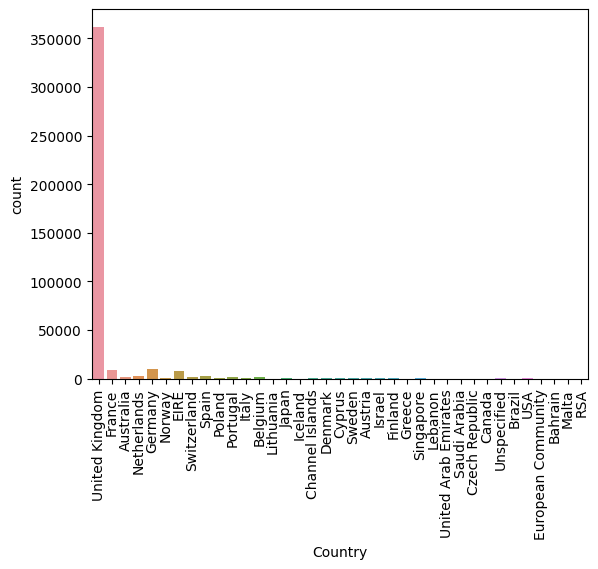

In [14]:
print(df["Country"].value_counts())
sns.countplot(x=df["Country"])
plt.xticks(rotation=90)
plt.show()

In [15]:
df.shape

(406829, 8)

In [16]:
#no need of outlier removal
#droping duplicate values
df=df.drop_duplicates()
df.shape

(401604, 8)

In [17]:
#unique columns in customerID
unique_cust=df["CustomerID"].unique()
print(unique_cust)
print("number of unique customer ID",df["CustomerID"].nunique())

[17850 13047 12583 ... 13298 14569 12713]
number of unique customer ID 4372


In [18]:
for i,j in df.groupby('CustomerID')["Description","CustomerID"]:
    print(i,j)

12346 

C:\Users\MURUGAN K\AppData\Local\Temp\ipykernel_10560\1898905319.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  for i,j in df.groupby('CustomerID')["Description","CustomerID"]:


                          Description  CustomerID
61619  MEDIUM CERAMIC TOP STORAGE JAR       12346
61624  MEDIUM CERAMIC TOP STORAGE JAR       12346
12347                                 Description  CustomerID
14938       BLACK CANDELABRA T-LIGHT HOLDER       12347
14939     AIRLINE BAG VINTAGE JET SET BROWN       12347
14940     COLOUR GLASS. STAR T-LIGHT HOLDER       12347
14941               MINI PAINT SET VINTAGE        12347
14942   CLEAR DRAWER KNOB ACRYLIC EDWARDIAN       12347
...                                     ...         ...
535010               WOODLAND CHARLOTTE BAG       12347
535011         PINK GOOSE FEATHER TREE 60CM       12347
535012  CHRISTMAS TABLE SILVER CANDLE SPIKE       12347
535013         MINI PLAYING CARDS SPACEBOY        12347
535014       MINI PLAYING CARDS DOLLY GIRL        12347

[182 rows x 2 columns]
12348                                Description  CustomerID
34083       72 SWEETHEART FAIRY CAKE CASES       12348
34084      60 CAKE CASES DOLLY G

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [19]:
for i in df.groupby("CustomerID")["Description"].apply(" ".join)[:20]:
    print(i)

MEDIUM CERAMIC TOP STORAGE JAR MEDIUM CERAMIC TOP STORAGE JAR
BLACK CANDELABRA T-LIGHT HOLDER AIRLINE BAG VINTAGE JET SET BROWN COLOUR GLASS. STAR T-LIGHT HOLDER MINI PAINT SET VINTAGE  CLEAR DRAWER KNOB ACRYLIC EDWARDIAN PINK DRAWER KNOB ACRYLIC EDWARDIAN GREEN DRAWER KNOB ACRYLIC EDWARDIAN RED DRAWER KNOB ACRYLIC EDWARDIAN PURPLE DRAWERKNOB ACRYLIC EDWARDIAN BLUE DRAWER KNOB ACRYLIC EDWARDIAN ALARM CLOCK BAKELIKE CHOCOLATE ALARM CLOCK BAKELIKE GREEN ALARM CLOCK BAKELIKE RED  ALARM CLOCK BAKELIKE PINK ALARM CLOCK BAKELIKE ORANGE FOUR HOOK  WHITE LOVEBIRDS BLACK GRAND BAROQUE PHOTO FRAME BATHROOM METAL SIGN  LARGE HEART MEASURING SPOONS BOX OF 6 ASSORTED COLOUR TEASPOONS BLUE 3 PIECE POLKADOT CUTLERY SET RED 3 PIECE RETROSPOT CUTLERY SET PINK 3 PIECE POLKADOT CUTLERY SET EMERGENCY FIRST AID TIN  SET OF 2 TINS VINTAGE BATHROOM  SET/3 DECOUPAGE STACKING TINS BOOM BOX SPEAKER BOYS RED TOADSTOOL LED NIGHT LIGHT 3D DOG PICTURE PLAYING CARDS BLACK EAR MUFF HEADPHONES CAMOUFLAGE EAR MUFF HEAD

C:\Users\MURUGAN K\AppData\Local\Temp\ipykernel_10560\3556087414.py:1: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  for i in df.groupby("CustomerID")["Description"].apply(" ".join)[:20]:


In [20]:
#concatenate the products description based on unique customer ID to group customers based on products grouping
df1=df.groupby("CustomerID")["Description"].apply(" ".join).reset_index()
df1

,CustomerID,Description
0,12346,MEDIUM CERAMIC TOP STORAGE JAR MEDIUM CERAMIC ...
1,12347,BLACK CANDELABRA T-LIGHT HOLDER AIRLINE BAG VI...
2,12348,72 SWEETHEART FAIRY CAKE CASES 60 CAKE CASES D...
3,12349,PARISIENNE CURIO CABINET SWEETHEART WALL TIDY ...
4,12350,CHOCOLATE THIS WAY METAL SIGN METAL SIGN NEIGH...
...,...,...
4367,18280,WOOD BLACK BOARD ANT WHITE FINISH RETROSPOT LA...
4368,18281,ROBOT BIRTHDAY CARD CARD CIRCUS PARADE PENNY F...
4369,18282,ANTIQUE CREAM CUTLERY CUPBOARD FRENCH STYLE ST...
4370,18283,CHARLOTTE BAG PINK POLKADOT LUNCH BAG WOODLAND...


In [21]:
#extracting alone description column alone to group process with NLP
data=pd.DataFrame(df1.loc[:,"Description"])
data

,Description
0,MEDIUM CERAMIC TOP STORAGE JAR MEDIUM CERAMIC ...
1,BLACK CANDELABRA T-LIGHT HOLDER AIRLINE BAG VI...
2,72 SWEETHEART FAIRY CAKE CASES 60 CAKE CASES D...
3,PARISIENNE CURIO CABINET SWEETHEART WALL TIDY ...
4,CHOCOLATE THIS WAY METAL SIGN METAL SIGN NEIGH...
...,...
4367,WOOD BLACK BOARD ANT WHITE FINISH RETROSPOT LA...
4368,ROBOT BIRTHDAY CARD CARD CIRCUS PARADE PENNY F...
4369,ANTIQUE CREAM CUTLERY CUPBOARD FRENCH STYLE ST...
4370,CHARLOTTE BAG PINK POLKADOT LUNCH BAG WOODLAND...


In [22]:
#removing punctuations
data["Description"]=data["Description"].str.replace("[^a-zA-Z0-9]"," ")
data

C:\Users\MURUGAN K\AppData\Local\Temp\ipykernel_10560\2410995046.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  data["Description"]=data["Description"].str.replace("[^a-zA-Z0-9]"," ")


,Description
0,MEDIUM CERAMIC TOP STORAGE JAR MEDIUM CERAMIC ...
1,BLACK CANDELABRA T LIGHT HOLDER AIRLINE BAG VI...
2,72 SWEETHEART FAIRY CAKE CASES 60 CAKE CASES D...
3,PARISIENNE CURIO CABINET SWEETHEART WALL TIDY ...
4,CHOCOLATE THIS WAY METAL SIGN METAL SIGN NEIGH...
...,...
4367,WOOD BLACK BOARD ANT WHITE FINISH RETROSPOT LA...
4368,ROBOT BIRTHDAY CARD CARD CIRCUS PARADE PENNY F...
4369,ANTIQUE CREAM CUTLERY CUPBOARD FRENCH STYLE ST...
4370,CHARLOTTE BAG PINK POLKADOT LUNCH BAG WOODLAND...


In [23]:
#removing short lettered word
data["Description"]=data["Description"].apply(lambda row:" ".join([word for word in row.split() if len(word)>2]))
data

,Description
0,MEDIUM CERAMIC TOP STORAGE JAR MEDIUM CERAMIC ...
1,BLACK CANDELABRA LIGHT HOLDER AIRLINE BAG VINT...
2,SWEETHEART FAIRY CAKE CASES CAKE CASES DOLLY G...
3,PARISIENNE CURIO CABINET SWEETHEART WALL TIDY ...
4,CHOCOLATE THIS WAY METAL SIGN METAL SIGN NEIGH...
...,...
4367,WOOD BLACK BOARD ANT WHITE FINISH RETROSPOT LA...
4368,ROBOT BIRTHDAY CARD CARD CIRCUS PARADE PENNY F...
4369,ANTIQUE CREAM CUTLERY CUPBOARD FRENCH STYLE ST...
4370,CHARLOTTE BAG PINK POLKADOT LUNCH BAG WOODLAND...


In [24]:
#converting to lower case letter 
data["Description"]=[row.lower() for row in data["Description"]]
data.head()

,Description
0,medium ceramic top storage jar medium ceramic ...
1,black candelabra light holder airline bag vint...
2,sweetheart fairy cake cases cake cases dolly g...
3,parisienne curio cabinet sweetheart wall tidy ...
4,chocolate this way metal sign metal sign neigh...


In [25]:
#removing stop words
import nltk
nltk.download("punkt")
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk import word_tokenize
stopwords=stopwords.words("english")
stopwords

[nltk_data] Downloading package punkt to C:\Users\MURUGAN
[nltk_data]     K\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\MURUGAN
[nltk_data]     K\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [26]:
#function to remove stop words
def remove_stop(row):
    word=word_tokenize(row)
    new_row=" ".join([i for i in word if i not in stopwords])
    return new_row
data["Description"]=[remove_stop(row) for row in data["Description"]]
data.head()

,Description
0,medium ceramic top storage jar medium ceramic ...
1,black candelabra light holder airline bag vint...
2,sweetheart fairy cake cases cake cases dolly g...
3,parisienne curio cabinet sweetheart wall tidy ...
4,chocolate way metal sign metal sign neighbourh...


In [27]:
#lemmatize
nltk.download("wordnet")
nltk.download("omw-1.4")
nltk.download("averaged_perceptron_tagger")
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
lemmatizer=WordNetLemmatizer()

[nltk_data] Downloading package wordnet to C:\Users\MURUGAN
[nltk_data]     K\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to C:\Users\MURUGAN
[nltk_data]     K\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\MURUGAN K\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [28]:
def nltk_to_word_net_tag(nltk_tag):
    if nltk_tag.startswith("J"):
        return wordnet.ADJ
    elif nltk_tag.startswith("N"):
        return wordnet.NOUN
    elif nltk_tag.startswith("V"):
        return wordnet.VERB
    elif nltk_tag.startswith("R"):
        return wordnet.ADV
    else:
        return None
def lemmatize(sentence):
    nltk_tagged=nltk.pos_tag(nltk.word_tokenize(sentence))
    word_tagged=map(lambda x:(x[0],nltk_to_word_net_tag(x[1])),nltk_tagged)
    lemmatize_sentence=[]
    for word,tag in word_tagged:
        if tag is None:
            lemmatize_sentence.append(word)
        else:
            lemmatize_sentence.append(lemmatizer.lemmatize(word,tag))
    return " ".join(lemmatize_sentence)
data["Description"]=data["Description"].apply(lambda x: lemmatize(x))
data

,Description
0,medium ceramic top storage jar medium ceramic ...
1,black candelabra light holder airline bag vint...
2,sweetheart fairy cake case cake case dolly gir...
3,parisienne curio cabinet sweetheart wall tidy ...
4,chocolate way metal sign metal sign neighbourh...
...,...
4367,wood black board ant white finish retrospot la...
4368,robot birthday card card circus parade penny f...
4369,antique cream cutlery cupboard french style st...
4370,charlotte bag pink polkadot lunch bag woodland...


In [29]:
#freq dist
sns.set(style="white")
from nltk import FreqDist
all_words=" ".join(text for text in data["Description"])
all_words

'medium ceramic top storage jar medium ceramic top storage jar black candelabra light holder airline bag vintage jet set brown colour glass star light holder mini paint set vintage clear drawer knob acrylic edwardian pink drawer knob acrylic edwardian green drawer knob acrylic edwardian red drawer knob acrylic edwardian purple drawerknob acrylic edwardian blue drawer knob acrylic edwardian alarm clock bakelike chocolate alarm clock bakelike green alarm clock bakelike red alarm clock bakelike pink alarm clock bakelike orange four hook white lovebird black grand baroque photo frame bathroom metal sign large heart measure spoon box assort colour teaspoon blue piece polkadot cutlery set red piece retrospot cutlery set pink piece polkadot cutlery set emergency first aid tin set tin vintage bathroom set decoupage stack tin boom box speaker boys red toadstool lead night light dog picture playing card black ear muff headphone camouflage ear muff headphone pink new baroquecandlestick candle blu

In [30]:
all_words=all_words.split()
words_df=FreqDist(all_words)
words_df

FreqDist({'set': 47612, 'bag': 38347, 'heart': 33212, 'red': 32935, 'retrospot': 26754, 'vintage': 25761, 'design': 24087, 'box': 20814, 'pink': 20770, 'christmas': 19082, ...})

In [31]:
print(len(words_df))
for i,j in words_df.items():
    print(i,j)

1869
medium 1095
ceramic 7005
top 1808
storage 3405
jar 5023
black 5508
candelabra 40
light 17911
holder 13014
airline 849
bag 38347
vintage 25761
jet 353
set 47612
brown 622
colour 6874
glass 9203
star 5736
mini 6011
paint 2503
clear 452
drawer 5321
knob 3824
acrylic 1127
edwardian 2193
pink 20770
green 6281
red 32935
purple 957
drawerknob 151
blue 14548
alarm 3598
clock 5991
bakelike 3575
chocolate 3654
orange 934
four 487
hook 3397
white 16399
lovebird 1093
grand 341
baroque 833
photo 2779
frame 5600
bathroom 1100
metal 15888
sign 12780
large 7587
heart 33212
measure 1018
spoon 878
box 20814
assort 5622
teaspoon 75
piece 1968
polkadot 8852
cutlery 3840
retrospot 26754
emergency 126
first 464
aid 396
tin 13088
decoupage 409
stack 127
boom 186
speaker 98
boys 175
toadstool 1466
lead 1264
night 1647
dog 2810
picture 1932
playing 765
card 12519
ear 56
muff 56
headphone 54
camouflage 176
new 703
baroquecandlestick 33
candle 7201
candlestick 160
woodland 4980
charlotte 4488
sandwich 41
ba

In [32]:
words_df=pd.DataFrame({"word":list(words_df.keys()),"counts":list(words_df.values())})
words_df

,word,counts
0,medium,1095
1,ceramic,7005
2,top,1808
3,storage,3405
4,jar,5023
...,...,...
1864,sow,1
1865,spots,1
1866,chests,2
1867,capiz,1


In [33]:
words_df=words_df.nlargest(columns="counts",n=30)
words_df

,word,counts
13,set,47612
10,bag,38347
48,heart,33212
27,red,32935
57,retrospot,26754
11,vintage,25761
169,design,24087
51,box,20814
25,pink,20770
185,christmas,19082


In [34]:
words_df.sort_values("counts",ascending=False,inplace=True)
words_df

,word,counts
13,set,47612
10,bag,38347
48,heart,33212
27,red,32935
57,retrospot,26754
11,vintage,25761
169,design,24087
51,box,20814
25,pink,20770
185,christmas,19082


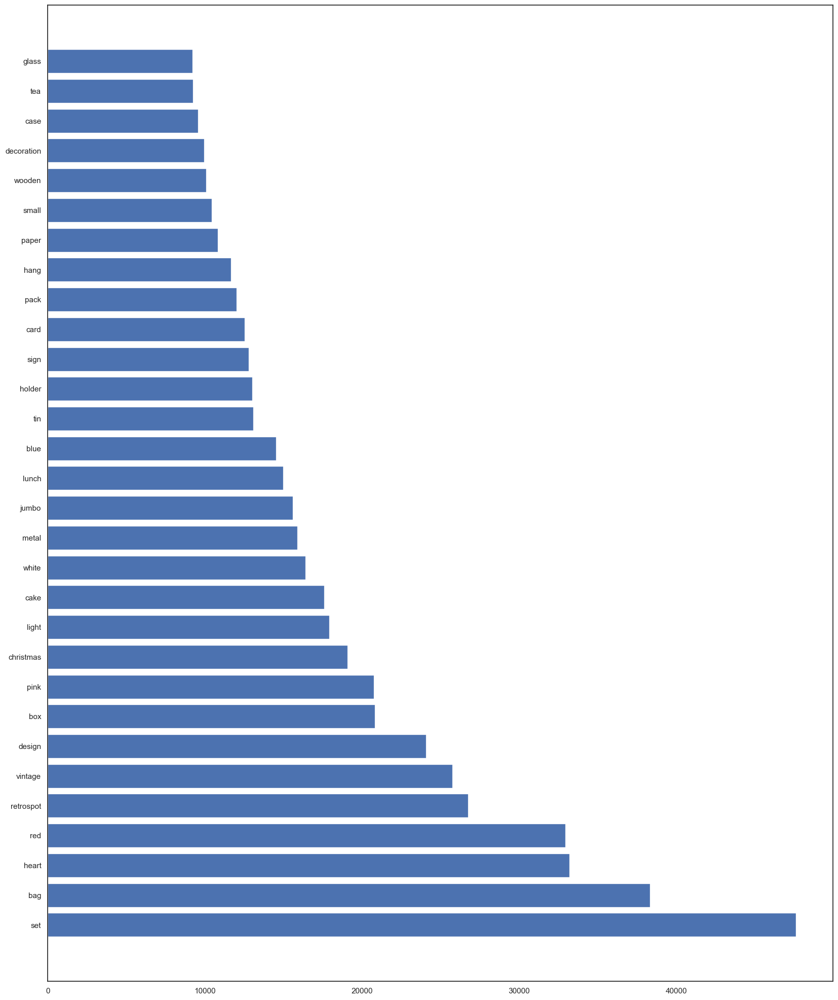

In [35]:
plt.figure(figsize=(20,25))
plt.barh(words_df["word"],words_df["counts"])
plt.show()

In [36]:
from wordcloud import WordCloud
all_words=" ".join(text for text in data["Description"])
word_cloud_df=WordCloud(width=800,height=800,background_color="white",min_font_size=10).generate(all_words)
word_cloud_df

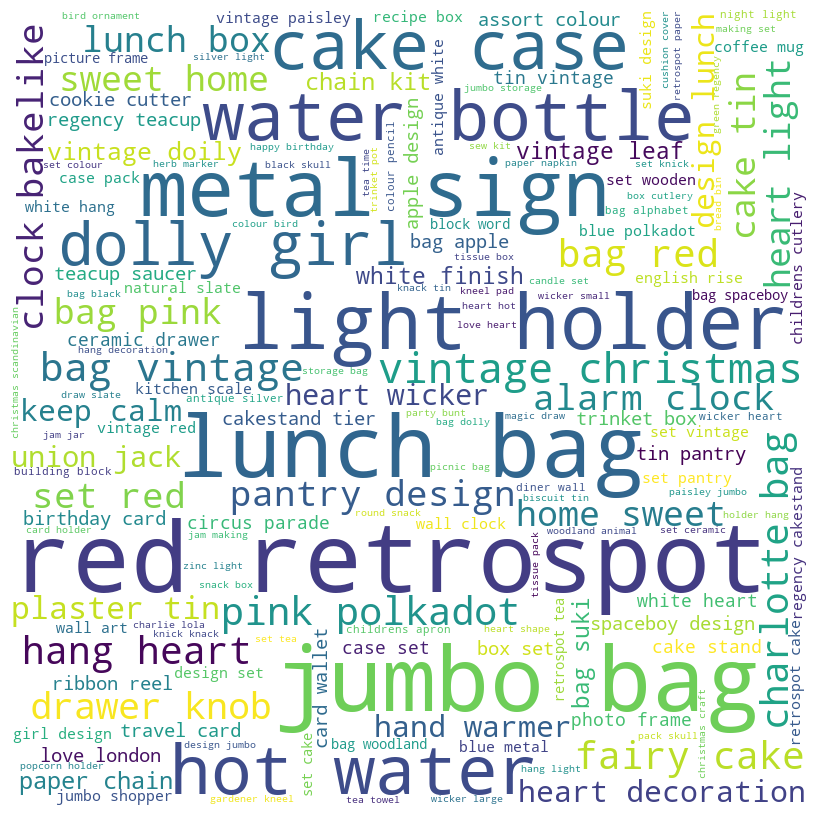

In [37]:
plt.figure(figsize=(8,8),facecolor=None)
plt.imshow(word_cloud_df)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

In [38]:
#tfidf bag of words
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf=TfidfVectorizer(max_features=2500)
X=tfidf.fit_transform(data.Description).toarray()

In [39]:
X

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.02567549, 0.        ,
        0.00269712],
       [0.        , 0.        , 0.        , ..., 0.06330929, 0.        ,
        0.        ]])

In [40]:
feature_names=tfidf.get_feature_names_out()
feature_names

array(['120cm', '125g', '15c', ..., 'yellow', 'yuletide', 'zinc'],
      dtype=object)

In [41]:
len(feature_names)

1869

In [42]:
file=pd.DataFrame(X,columns=feature_names)
file

,120cm,125g,15c,15cm,16x16cm,17080,18pc,200,20light,250g,...,world,woven,wrap,wreath,wreck,write,xmas,yellow,yuletide,zinc
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.034743,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.067574,0.0,0.0,0.0,0.0,0.039964,0.0,0.033585
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4367,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
4368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
4369,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000
4370,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.018993,0.0,0.0,0.0,0.0,0.025675,0.0,0.002697


In [43]:
#writing and reading pickle file so that we could run process from here for kmeans
file.to_pickle("e-commerce_proj_file_1.pkl")

In [44]:
file=pd.read_pickle("e-commerce_proj_file_1.pkl")

In [46]:
X=file

In [47]:
print(X)

      120cm  125g  15c  15cm  16x16cm  17080  18pc  200  20light  250g  ...  \
0       0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
1       0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
2       0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
3       0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
4       0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
...     ...   ...  ...   ...      ...    ...   ...  ...      ...   ...  ...   
4367    0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
4368    0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
4369    0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
4370    0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   
4371    0.0   0.0  0.0   0.0      0.0    0.0   0.0  0.0      0.0   0.0  ...   

         world  woven      wrap  wreath  wreck  wri

In [48]:
#choosing the best value of k
from sklearn.cluster import KMeans
obj_for_all_k=[]
for k in range(1,50):
    km=KMeans(n_clusters=k,random_state=0)
    km.fit(X)
    obj_for_all_k.append(km.inertia_)
    print("value of k",k,"obj value is",km.inertia_)
print(obj_for_all_k) 

C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 1 obj value is 3659.4542898872087


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 2 obj value is 3534.678960610762


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 3 obj value is 3458.42375717075


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 4 obj value is 3397.9788922539014


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 5 obj value is 3353.593855926346


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 6 obj value is 3310.5902826609536


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 7 obj value is 3273.6520596388905


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 8 obj value is 3241.709737665484


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 9 obj value is 3219.0572644658832


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 10 obj value is 3186.1769667811654


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 11 obj value is 3165.118241060948


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 12 obj value is 3141.796393864215


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 13 obj value is 3116.4812824548985


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 14 obj value is 3100.141306510836


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 15 obj value is 3080.3263921932694


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 16 obj value is 3063.2421034598024


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 17 obj value is 3051.4690434766435


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 18 obj value is 3035.8795708453304


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 19 obj value is 3026.5156311128726


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 20 obj value is 3011.767404164072


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 21 obj value is 3002.7812906748554


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 22 obj value is 2995.1396196825476


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 23 obj value is 2980.6220903068515


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 24 obj value is 2973.7405924049185


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 25 obj value is 2964.825322647062


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 26 obj value is 2953.308270311738


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 27 obj value is 2945.482701468374


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 28 obj value is 2938.059899267312


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 29 obj value is 2928.991272057051


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 30 obj value is 2921.2802891536626


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 31 obj value is 2910.9437553109647


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 32 obj value is 2908.894438905334


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 33 obj value is 2899.8991699719277


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 34 obj value is 2891.7627461655


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 35 obj value is 2882.33369825109


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 36 obj value is 2875.7983337283545


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 37 obj value is 2871.486880361531


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 38 obj value is 2861.6679364071733


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 39 obj value is 2860.9654815958243


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 40 obj value is 2852.72211129239


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 41 obj value is 2845.0787262369795


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 42 obj value is 2843.018797750699


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 43 obj value is 2837.960073714852


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 44 obj value is 2831.539749724884


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 45 obj value is 2826.871232632993


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 46 obj value is 2819.1150341646558


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 47 obj value is 2813.7383906710265


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 48 obj value is 2810.0196576699127


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 49 obj value is 2806.7708778305528
[3659.4542898872087, 3534.678960610762, 3458.42375717075, 3397.9788922539014, 3353.593855926346, 3310.5902826609536, 3273.6520596388905, 3241.709737665484, 3219.0572644658832, 3186.1769667811654, 3165.118241060948, 3141.796393864215, 3116.4812824548985, 3100.141306510836, 3080.3263921932694, 3063.2421034598024, 3051.4690434766435, 3035.8795708453304, 3026.5156311128726, 3011.767404164072, 3002.7812906748554, 2995.1396196825476, 2980.6220903068515, 2973.7405924049185, 2964.825322647062, 2953.308270311738, 2945.482701468374, 2938.059899267312, 2928.991272057051, 2921.2802891536626, 2910.9437553109647, 2908.894438905334, 2899.8991699719277, 2891.7627461655, 2882.33369825109, 2875.7983337283545, 2871.486880361531, 2861.6679364071733, 2860.9654815958243, 2852.72211129239, 2845.0787262369795, 2843.018797750699, 2837.960073714852, 2831.539749724884, 2826.871232632993, 2819.1150341646558, 2813.7383906710265, 2810.0196576699127, 2806.7708778305528]


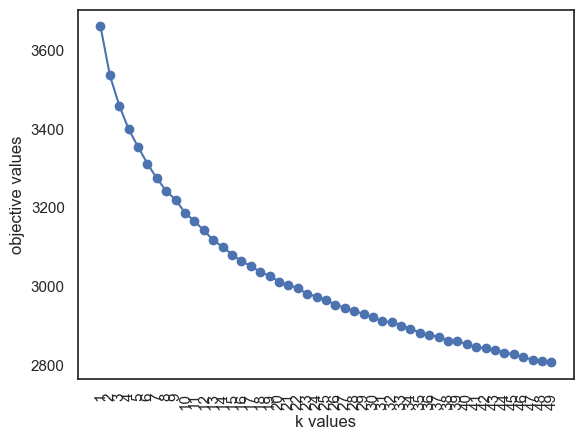

In [111]:
import matplotlib.pyplot as plt
plt.plot(range(1,50),obj_for_all_k,marker="o")
plt.xlabel("k values")
plt.ylabel("objective values")
plt.xticks(range(1,50),rotation=90)
plt.show()

In [121]:
#choosing the best value of k checking all values from 1 to 100
from sklearn.cluster import KMeans
obj_for_all_k=[]
for k in range(1,100):
    km=KMeans(n_clusters=k,random_state=0)
    km.fit(X)
    obj_for_all_k.append(km.inertia_)
    print("value of k",k,"obj value is",km.inertia_)
print(obj_for_all_k) 

C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 1 obj value is 3659.4542898872087


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 2 obj value is 3534.678960610762


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 3 obj value is 3458.4237571707495


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 4 obj value is 3397.9788922539014


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 5 obj value is 3353.593855926346


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 6 obj value is 3310.5902826609536


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 7 obj value is 3273.6520596388905


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 8 obj value is 3241.709737665484


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 9 obj value is 3219.0572644658832


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 10 obj value is 3186.1769667811654


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 11 obj value is 3165.118241060948


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 12 obj value is 3141.796393864215


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 13 obj value is 3116.4812824548985


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 14 obj value is 3100.141306510836


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 15 obj value is 3080.3263921932694


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 16 obj value is 3063.2421034598024


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 17 obj value is 3051.4690434766435


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 18 obj value is 3035.87957084533


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 19 obj value is 3026.515631112873


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 20 obj value is 3011.767404164072


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 21 obj value is 3002.7812906748554


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 22 obj value is 2995.1396196825476


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 23 obj value is 2980.6220903068515


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 24 obj value is 2973.7405924049185


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 25 obj value is 2964.825322647062


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 26 obj value is 2953.308270311738


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 27 obj value is 2945.482701468374


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 28 obj value is 2938.059899267312


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 29 obj value is 2928.991272057051


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 30 obj value is 2921.2802891536626


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 31 obj value is 2910.9437553109647


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 32 obj value is 2908.894438905334


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 33 obj value is 2899.8991699719277


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 34 obj value is 2891.7627461655


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 35 obj value is 2882.33369825109


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 36 obj value is 2875.7983337283545


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 37 obj value is 2871.486880361531


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 38 obj value is 2861.6679364071733


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 39 obj value is 2860.9654815958243


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 40 obj value is 2852.72211129239


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 41 obj value is 2845.0787262369795


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 42 obj value is 2843.018797750699


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 43 obj value is 2837.960073714852


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 44 obj value is 2831.539749724884


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 45 obj value is 2826.871232632993


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 46 obj value is 2819.1150341646558


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 47 obj value is 2813.7383906710265


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 48 obj value is 2810.0196576699127


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 49 obj value is 2806.7708778305528


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 50 obj value is 2800.177978650543


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 51 obj value is 2792.175151374526


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 52 obj value is 2785.2297008694095


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 53 obj value is 2782.5375874476204


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 54 obj value is 2780.544422412884


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 55 obj value is 2776.553875735291


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 56 obj value is 2771.087827169953


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 57 obj value is 2766.677578964168


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 58 obj value is 2762.346042388571


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 59 obj value is 2758.038714674185


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 60 obj value is 2753.8486279680997


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 61 obj value is 2747.2514581402947


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 62 obj value is 2745.932638897729


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 63 obj value is 2736.033159260043


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 64 obj value is 2735.187014310977


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 65 obj value is 2733.039488333965


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 66 obj value is 2730.5865298558383


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 67 obj value is 2729.318009626314


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 68 obj value is 2720.5114886176875


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 69 obj value is 2722.3082171906435


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 70 obj value is 2714.913489933854


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 71 obj value is 2713.5297625393496


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 72 obj value is 2709.567819852122


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 73 obj value is 2704.3339326818013


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 74 obj value is 2702.059511269067


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 75 obj value is 2694.6570055294846


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 76 obj value is 2696.3221478796145


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 77 obj value is 2692.5283752127425


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 78 obj value is 2687.654003171716


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 79 obj value is 2687.8311521577366


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 80 obj value is 2686.5300508105684


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 81 obj value is 2676.1279283642666


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 82 obj value is 2677.8525363667454


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 83 obj value is 2674.5976418836435


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 84 obj value is 2669.721313036133


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 85 obj value is 2666.307634929876


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 86 obj value is 2668.568643240511


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 87 obj value is 2660.5168064930112


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 88 obj value is 2660.712138052397


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 89 obj value is 2658.768074747594


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 90 obj value is 2650.427656291398


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 91 obj value is 2651.355188834035


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 92 obj value is 2650.2451604212547


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 93 obj value is 2645.8528324034637


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 94 obj value is 2642.2481571691296


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 95 obj value is 2638.426795870837


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 96 obj value is 2638.632527240632


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 97 obj value is 2634.456214045774


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 98 obj value is 2627.1560103952706


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 99 obj value is 2630.286893213311
[3659.4542898872087, 3534.678960610762, 3458.4237571707495, 3397.9788922539014, 3353.593855926346, 3310.5902826609536, 3273.6520596388905, 3241.709737665484, 3219.0572644658832, 3186.1769667811654, 3165.118241060948, 3141.796393864215, 3116.4812824548985, 3100.141306510836, 3080.3263921932694, 3063.2421034598024, 3051.4690434766435, 3035.87957084533, 3026.515631112873, 3011.767404164072, 3002.7812906748554, 2995.1396196825476, 2980.6220903068515, 2973.7405924049185, 2964.825322647062, 2953.308270311738, 2945.482701468374, 2938.059899267312, 2928.991272057051, 2921.2802891536626, 2910.9437553109647, 2908.894438905334, 2899.8991699719277, 2891.7627461655, 2882.33369825109, 2875.7983337283545, 2871.486880361531, 2861.6679364071733, 2860.9654815958243, 2852.72211129239, 2845.0787262369795, 2843.018797750699, 2837.960073714852, 2831.539749724884, 2826.871232632993, 2819.1150341646558, 2813.7383906710265, 2810.0196576699127, 2806.7708778305528, 28

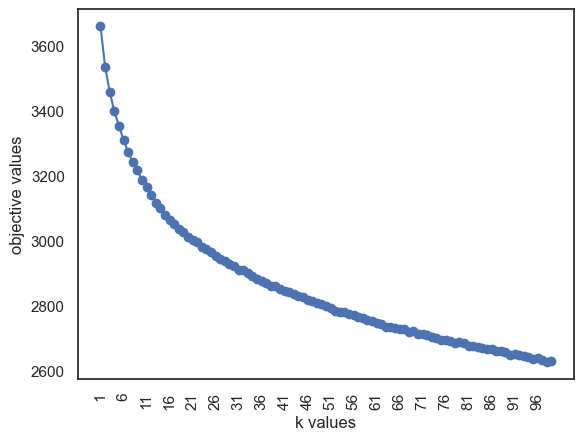

In [126]:
import matplotlib.pyplot as plt
plt.plot(range(1,100),obj_for_all_k,marker="o")
plt.xlabel("k values")
plt.ylabel("objective values")
plt.xticks(range(1,100,5),rotation=90)
plt.show()

In [114]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
score_for_all_k=[]
for k in range(2,50):
    km=KMeans(n_clusters=k,random_state=0)
    km.fit(X)
    score_for_all_k.append(silhouette_score(X,km.labels_))
    print("value of k",k,"silhouette score is",silhouette_score(X,km.labels_))
print(score_for_all_k)

C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 2 silhouette score is 0.018354603919546273


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 3 silhouette score is 0.012458275840792449


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 4 silhouette score is 0.01670881890992083


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 5 silhouette score is 0.020468926307030712


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 6 silhouette score is 0.02242887965571633


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 7 silhouette score is 0.025962552899683678


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 8 silhouette score is 0.026449122644611276


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 9 silhouette score is 0.027192971173918338


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 10 silhouette score is 0.031048972922460415


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 11 silhouette score is 0.031706783327524565


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 12 silhouette score is 0.026016380494048287


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 13 silhouette score is 0.028805582920859243


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 14 silhouette score is 0.026142014992157143


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 15 silhouette score is 0.027545857858452906


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 16 silhouette score is 0.02924533942450211


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 17 silhouette score is 0.028497270918552618


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 18 silhouette score is 0.025493947450045046


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 19 silhouette score is 0.029038968022076013


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 20 silhouette score is 0.030869544318967185


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 21 silhouette score is 0.02871481840436814


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 22 silhouette score is 0.023964084384176125


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 23 silhouette score is 0.0271435822499705


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 24 silhouette score is 0.0287699623505194


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 25 silhouette score is 0.025027404341924093


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 26 silhouette score is 0.026449278070759006


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 27 silhouette score is 0.026871107440178864


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 28 silhouette score is 0.02617436819327902


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 29 silhouette score is 0.03222779590536143


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 30 silhouette score is 0.027607329824825725


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 31 silhouette score is 0.03010854239105243


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 32 silhouette score is 0.03154437403911176


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 33 silhouette score is 0.030964629139807284


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 34 silhouette score is 0.031203386503746003


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 35 silhouette score is 0.031301435168211954


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 36 silhouette score is 0.030653737067404808


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 37 silhouette score is 0.03163569577093227


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 38 silhouette score is 0.03204867816153951


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 39 silhouette score is 0.030642077235649025


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 40 silhouette score is 0.03131880261958851


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 41 silhouette score is 0.032866111192482374


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 42 silhouette score is 0.03190711911958445


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 43 silhouette score is 0.03665494078975744


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 44 silhouette score is 0.031076825974902703


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 45 silhouette score is 0.02904861133133532


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 46 silhouette score is 0.030835902692216068


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 47 silhouette score is 0.034859474404988294


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 48 silhouette score is 0.0257156404084936


C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


value of k 49 silhouette score is 0.03382686614805521
[0.018354603919546273, 0.012458275840792449, 0.01670881890992083, 0.020468926307030712, 0.02242887965571633, 0.025962552899683678, 0.026449122644611276, 0.027192971173918338, 0.031048972922460415, 0.031706783327524565, 0.026016380494048287, 0.028805582920859243, 0.026142014992157143, 0.027545857858452906, 0.02924533942450211, 0.028497270918552618, 0.025493947450045046, 0.029038968022076013, 0.030869544318967185, 0.02871481840436814, 0.023964084384176125, 0.0271435822499705, 0.0287699623505194, 0.025027404341924093, 0.026449278070759006, 0.026871107440178864, 0.02617436819327902, 0.03222779590536143, 0.027607329824825725, 0.03010854239105243, 0.03154437403911176, 0.030964629139807284, 0.031203386503746003, 0.031301435168211954, 0.030653737067404808, 0.03163569577093227, 0.03204867816153951, 0.030642077235649025, 0.03131880261958851, 0.032866111192482374, 0.03190711911958445, 0.03665494078975744, 0.031076825974902703, 0.02904861133133

In [213]:
print("max value is",max(score_for_all_k),"index value is",score_for_all_k.index(max(score_for_all_k)))

max value is 0.03665494078975744 index value is 41


In [49]:
#kmeans algorithm for grouping the products based on descriptions
from sklearn.cluster import KMeans
km=KMeans(n_clusters=41,random_state=0)
km.fit(X)

C:\Users\MURUGAN K\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=41, random_state=0)

In [50]:
print("value of k 41","obj value is",km.inertia_)

value of k 41 obj value is 2845.0787262369795


In [52]:
from sklearn.metrics import silhouette_score
print("value of k 41 silhouette score is",silhouette_score(X,km.labels_))

value of k 41 silhouette score is 0.032866111192482374


In [53]:
#data points assigned to cluster centers
km.labels_

array([27, 36, 19, ...,  5, 20, 18])

In [54]:
km.cluster_centers_

array([[1.08420217e-19, 1.43838522e-02, 0.00000000e+00, ...,
        1.32642953e-02, 0.00000000e+00, 6.88636426e-03],
       [4.14791438e-04, 4.54083608e-03, 1.09043669e-03, ...,
        5.02086829e-03, 1.32199533e-04, 6.97548415e-03],
       [2.23323103e-03, 1.30104261e-18, 5.92988937e-04, ...,
        8.07263163e-03, 3.28266334e-04, 1.74969404e-02],
       ...,
       [8.97135885e-04, 5.61734373e-03, 2.23857082e-04, ...,
        8.29761120e-03, 1.08420217e-19, 6.08427084e-03],
       [0.00000000e+00, 4.33680869e-19, 0.00000000e+00, ...,
        1.01510816e-03, 9.35420268e-04, 2.07358590e-03],
       [0.00000000e+00, 4.09164381e-03, 0.00000000e+00, ...,
        4.59458886e-03, 4.10566279e-03, 2.29091636e-02]])

In [55]:
km.n_iter_

48

In [56]:
cluster_center=pd.DataFrame(km.labels_,columns=["cluster_label"])
cluster_center

,cluster_label
0,27
1,36
2,19
3,24
4,27
...,...
4367,36
4368,38
4369,5
4370,20


In [57]:
#creating dataframe to group customers based on product cluster label
result_df=pd.concat([cluster_center["cluster_label"],df1["CustomerID"]],axis=1)
result_df

,cluster_label,CustomerID
0,27,12346
1,36,12347
2,19,12348
3,24,12349
4,27,12350
...,...,...
4367,36,18280
4368,38,18281
4369,5,18282
4370,20,18283


In [58]:
result_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4372 entries, 0 to 4371
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   cluster_label  4372 non-null   int32
 1   CustomerID     4372 non-null   int64
dtypes: int32(1), int64(1)
memory usage: 51.4 KB


In [59]:
for i,j in result_df.groupby("cluster_label").groups.items():
    print("cluster label",i)
    print(result_df[["CustomerID"]].filter(items=j,axis=0).reset_index())

cluster label 0
    index  CustomerID
0     113       12488
1     369       12811
2     567       13085
3     708       13276
4     780       13370
5     790       13388
6     854       13483
7     981       13657
8     986       13666
9    1083       13803
10   1111       13837
11   1140       13876
12   1413       14246
13   1538       14427
14   1650       14570
15   1691       14631
16   1910       14935
17   1922       14957
18   1987       15047
19   1988       15048
20   1993       15053
21   2144       15246
22   2230       15363
23   2288       15440
24   2369       15549
25   2380       15563
26   2392       15578
27   2612       15866
28   2626       15889
29   2848       16193
30   2861       16211
31   3045       16461
32   3059       16479
33   3168       16637
34   3667       17334
35   3691       17364
36   3704       17381
37   3720       17402
38   3782       17489
39   3789       17499
40   3866       17597
41   3993       17765
42   4041       17839
43   4126       

In [60]:
#grouping the customers and printing the customer ID belongs to each labels and also number of clusters belong to each label
for i,j in result_df.groupby("cluster_label").groups.items():
    #print("cluster label",i)
    temp=result_df[["CustomerID"]].filter(items=j,axis=0).reset_index()
    print("Total number of customer belong to",i,"cluster label=",len(temp.CustomerID))
    print("customer ID belongs to cluster label",i,"are as follows")
    print(temp.CustomerID)
#E-commerce customer segmentation as different groups based on products grouping as follows

Total number of customer belong to 0 cluster label= 47
customer ID belongs to cluster label 0 are as follows
0     12488
1     12811
2     13085
3     13276
4     13370
5     13388
6     13483
7     13657
8     13666
9     13803
10    13837
11    13876
12    14246
13    14427
14    14570
15    14631
16    14935
17    14957
18    15047
19    15048
20    15053
21    15246
22    15363
23    15440
24    15549
25    15563
26    15578
27    15866
28    15889
29    16193
30    16211
31    16461
32    16479
33    16637
34    17334
35    17364
36    17381
37    17402
38    17489
39    17499
40    17597
41    17765
42    17839
43    17950
44    17960
45    17967
46    17984
Name: CustomerID, dtype: int64
Total number of customer belong to 1 cluster label= 111
customer ID belongs to cluster label 1 are as follows
0      12354
1      12364
2      12378
3      12383
4      12403
       ...  
106    17519
107    17861
108    17862
109    17871
110    18041
Name: CustomerID, Length: 111, dtype: int64